# **Import LIbraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os 
import tensorflow as tf
import cv2
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout ,BatchNormalization
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.applications.mobilenet_v2 import  preprocess_input
from sklearn.metrics import classification_report, confusion_matrix



# Read Data ****

In [2]:
train_dir="/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/"
train_data=tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range=0.0,shear_range=0.1, zoom_range=0.0,
                                                           horizontal_flip=False,vertical_flip=False,rescale=1/255.0,
                                                           validation_split=0.1).flow_from_directory(train_dir,batch_size=64,
                                                                                                     target_size=(224,224),
                                                                                                     subset="training"
                                                                                                     ,color_mode='rgb',
                                                                                                    class_mode='categorical',shuffle=True)


Found 63282 images belonging to 38 classes.


In [3]:
train_data.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [4]:
train_data.class_indices.keys()

dict_keys(['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato__

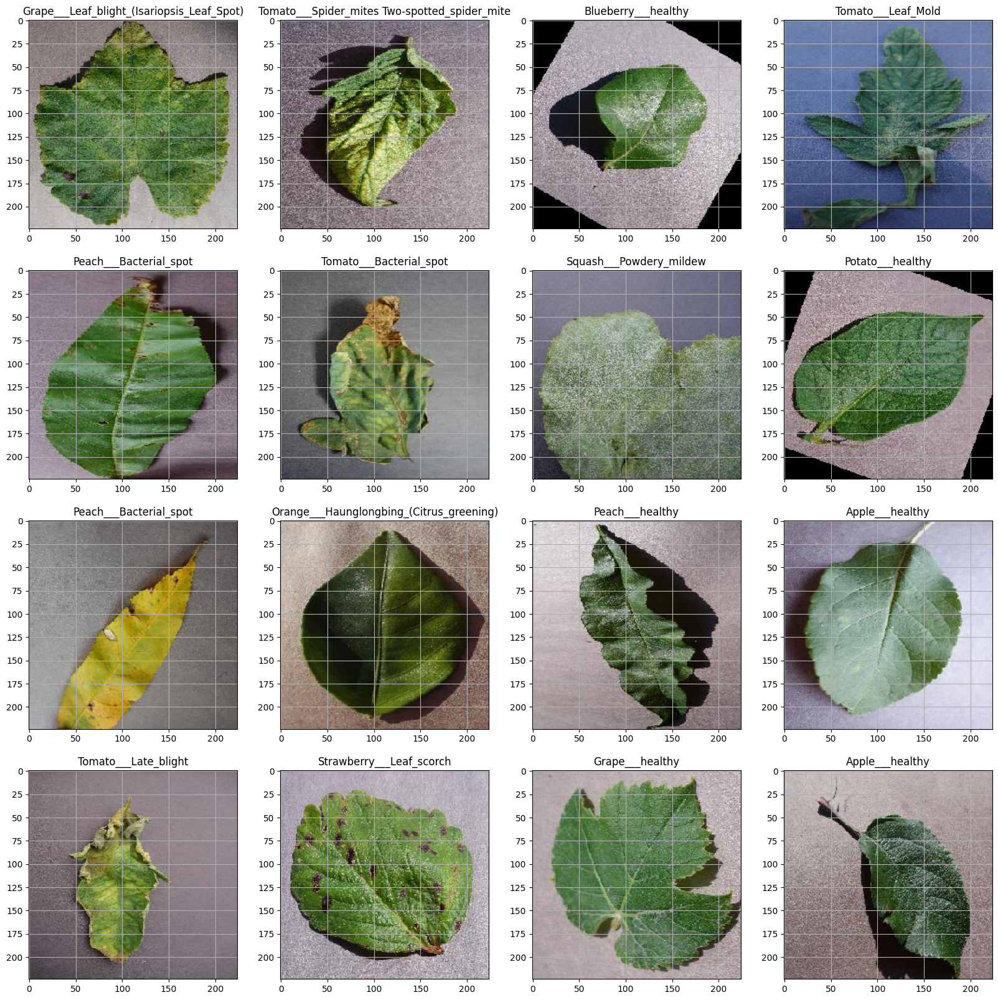

In [5]:
classes=list(train_data.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_data:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse 
        plt.grid(None)
    # show the plot
    plt.show()
    break

In [6]:
valid_data=tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range=0.0,shear_range=0.0, zoom_range=0.0,
                                                           horizontal_flip=False,vertical_flip=False,rescale=1/255.0,
                                                           validation_split=0.1).flow_from_directory(train_dir,batch_size=64,
                                                                                                     target_size=(224,224),
                                                                                                     subset="validation"
                                                                                                     ,color_mode='rgb',
                                                                                                    class_mode='categorical',shuffle=False)


Found 7013 images belonging to 38 classes.


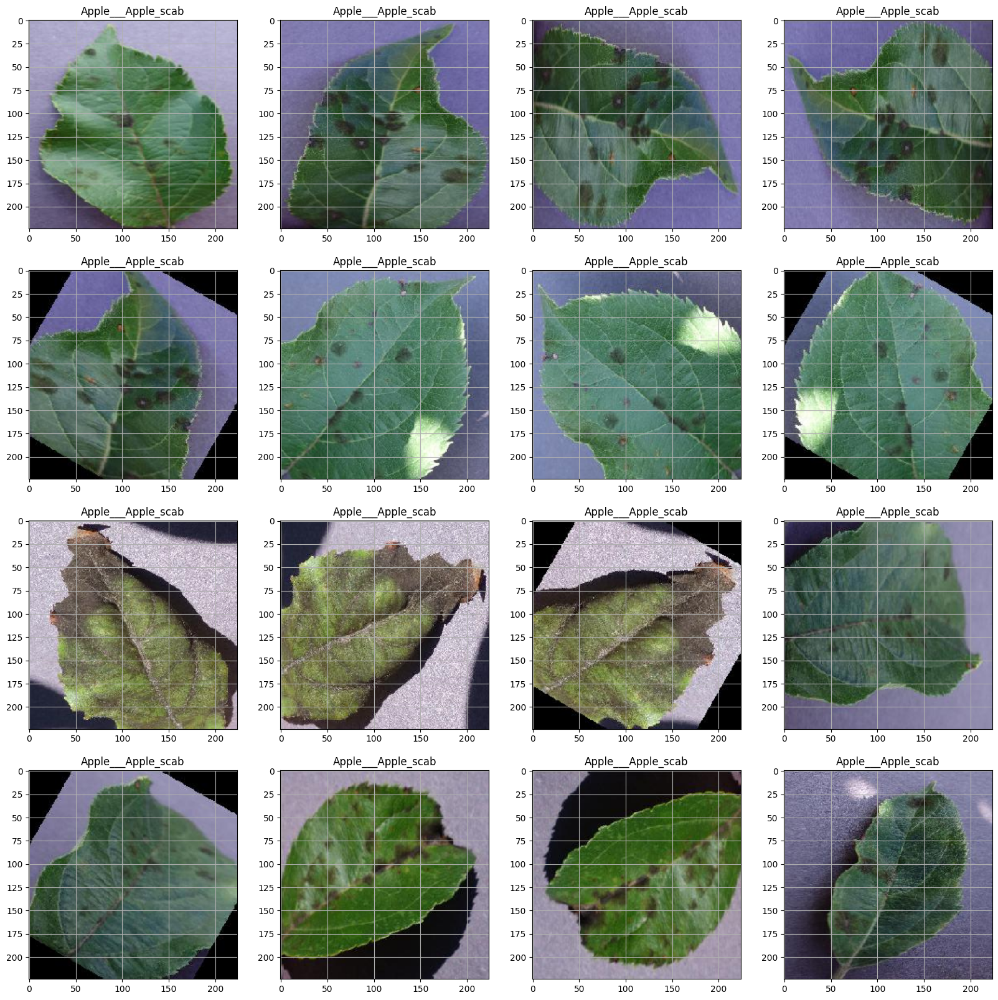

In [7]:
classes=list(valid_data.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in valid_data:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse 
        plt.grid(None)
    # show the plot
    plt.show()
    break

In [8]:
#testdata in the dataset doesn'
test_dir="/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/"


In [9]:
test_data=tf.keras.preprocessing.image.ImageDataGenerator(horizontal_flip=False,vertical_flip=False,rescale=1/255.0).flow_from_directory(test_dir,batch_size=64,
                                                                                                                                       color_mode='rgb',
                                                                                                                                       target_size=(224,224),
                                                                                                                                       class_mode='categorical')


Found 17572 images belonging to 38 classes.


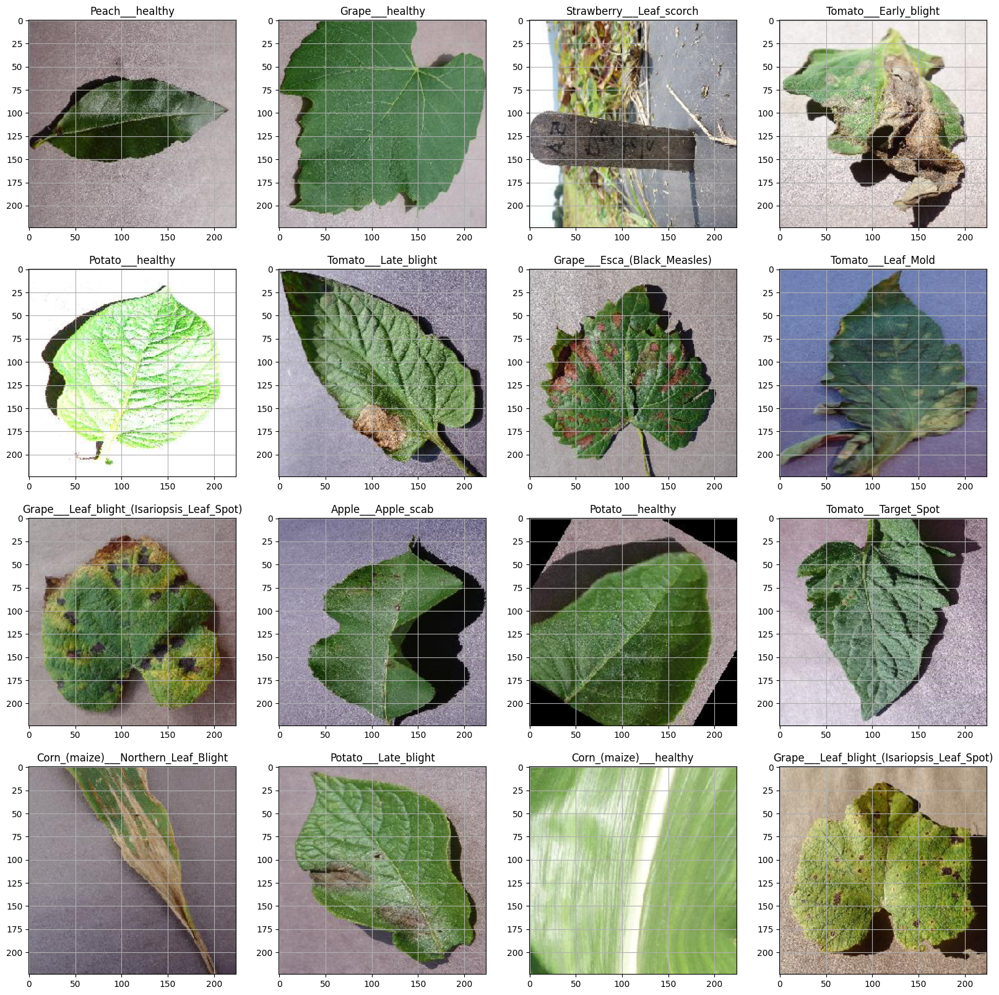

In [10]:
classes=list(test_data.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in test_data:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse 
        plt.grid(None)
    # show the plot
    plt.show()
    break

**CNN Model**

In [11]:
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [12]:
from tensorflow.keras.initializers import HeNormal

cnn_model = tf.keras.models.Sequential()

cnn_model.add(keras.layers.Conv2D(64,7, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02),kernel_initializer=HeNormal(), name="Conv1", input_shape= (224,224,3)))
cnn_model.add(keras.layers.BatchNormalization())
cnn_model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool1"))
cnn_model.add(keras.layers.Dropout(0.2))
cnn_model.add(keras.layers.Conv2D(128,5, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02),kernel_regularizer=tf.keras.regularizers.l2(0.01), name="Conv2"))
cnn_model.add(keras.layers.BatchNormalization())
cnn_model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool2"))
cnn_model.add(keras.layers.Dropout(0.3))

cnn_model.add(keras.layers.Conv2D(256,3, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02),kernel_regularizer=tf.keras.regularizers.l2(0.01), name="Conv3"))
cnn_model.add(keras.layers.BatchNormalization())
cnn_model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool3"))
cnn_model.add(keras.layers.Flatten(name="Flatt"))
cnn_model.add(keras.layers.Dense(128, activation=keras.layers.LeakyReLU(alpha=0.02), kernel_regularizer=tf.keras.regularizers.l2(0.01), name="Dense1"))
cnn_model.add(keras.layers.Dense(64, activation=keras.layers.LeakyReLU(alpha=0.02), kernel_regularizer=tf.keras.regularizers.l2(0.01), name="Dense2"))
cnn_model.add(keras.layers.Dense(38, activation="softmax", name="Output"))
cnn_model.summary()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Conv1 (Conv2D)                  │ (None, 224, 224, 64)   │         9,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1 (MaxPooling2D)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2 (Conv2D)                  │ (None, 112, 112, 128)  │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2 (MaxPooling2D)            │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3 (Conv2D)                  │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3 (MaxPooling2D)            │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatt (Flatten)                 │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense1 (Dense)                  │ (None, 128)            │    25,690,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense2 (Dense)                  │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 38)             │         2,470 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,212,326 (99.99 MB)

 Trainable params: 26,211,430 (99.99 MB)

 Non-trainable params: 896 (3.50 KB)

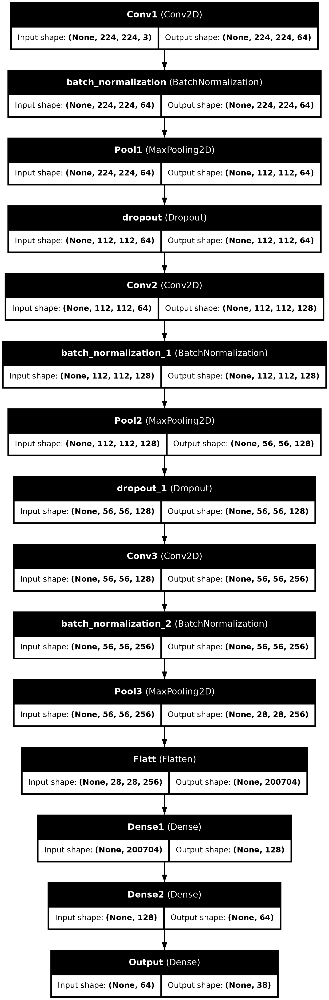

In [13]:
from tensorflow.keras.utils import plot_model
plot_model(cnn_model,show_shapes=True, show_layer_names=True)


In [14]:
cnn_model.compile(loss="categorical_crossentropy", optimizer= 'Adam', metrics=["accuracy",'precision','recall'])


In [15]:
# Training the model
cnn_history = cnn_model.fit(train_data,
                    epochs = 10,
                    validation_data = valid_data,
                    callbacks = callbacks
                    )


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734894679.683666     274 service.cc:145] XLA service 0x795040009e10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734894679.683739     274 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734894679.683743     274 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1734894704.893351     274 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


989/989 ━━━━━━━━━━━━━━━━━━━━ 1104s 1s/step - accuracy: 0.2463 - loss: 11.7176 - precision: 0.4685 - recall: 0.1099 - val_accuracy: 0.1912 - val_loss: 5.1080 - val_precision: 0.4142 - val_recall: 0.1218 - learning_rate: 0.0010
Epoch 2/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 758s 761ms/step - accuracy: 0.5825 - loss: 2.8234 - precision: 0.8102 - recall: 0.3449 - val_accuracy: 0.3863 - val_loss: 3.8526 - val_precision: 0.4968 - val_recall: 0.2883 - learning_rate: 0.0010
Epoch 3/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 751s 754ms/step - accuracy: 0.6431 - loss: 2.3627 - precision: 0.8239 - recall: 0.4613 - val_accuracy: 0.2557 - val_loss: 5.9974 - val_precision: 0.2979 - val_recall: 0.1985 - learning_rate: 0.0010
Epoch 4/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 746s 749ms/step - accuracy: 0.6883 - loss: 2.2176 - precision: 0.8331 - recall: 0.5426 - val_accuracy: 0.3546 - val_loss: 4.9021 - val_precision: 0.4430 - val_recall: 0.2689 - learning_rate: 0.0010
Epoch 5/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 752s 755ms/step - ac

In [16]:
cnn_predictions = cnn_model.predict(test_data)

275/275 ━━━━━━━━━━━━━━━━━━━━ 138s 502ms/step


In [17]:
y_pred_cnn = cnn_predictions.argmax(axis=-1)
# Compute classification report
print("Classification report : \n",classification_report(test_data.labels, y_pred_cnn, target_names = train_data.class_indices.keys()))


Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.03      0.02      0.02       504
                                 Apple___Black_rot       0.04      0.03      0.03       497
                          Apple___Cedar_apple_rust       0.02      0.03      0.03       440
                                   Apple___healthy       0.04      0.05      0.05       502
                               Blueberry___healthy       0.02      0.02      0.02       454
          Cherry_(including_sour)___Powdery_mildew       0.03      0.04      0.04       421
                 Cherry_(including_sour)___healthy       0.02      0.02      0.02       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.03      0.01      0.02       410
                       Corn_(maize)___Common_rust_       0.02      0.02      0.02       477
               Corn_(maize)___Northern_Leaf_Blight   

In [18]:
sns.set()

cnn_acc = cnn_history.history['accuracy']
cnn_val_acc = cnn_history.history['val_accuracy']

cnn_precision = cnn_history.history['precision']
cnn_val_precision = cnn_history.history['val_precision']

cnn_recall =cnn_history.history['recall']
cnn_val_recall =cnn_history.history['val_recall']

cnn_loss = cnn_history.history['loss']
cnn_val_loss = cnn_history.history['val_loss']

cnn_epochs = range(1, len(cnn_loss) + 1)

In [23]:
cnn_model_evaluate = cnn_model.evaluate(train_data)


989/989 ━━━━━━━━━━━━━━━━━━━━ 720s 728ms/step - accuracy: 0.7519 - loss: 1.8704 - precision: 0.8730 - recall: 0.6161


In [24]:
# Evaluate the model
cnn_model_evaluate = cnn_model.evaluate(train_data)
cnn_Loss_train=cnn_model_evaluate[0]
cnn_Accuracy_train=cnn_model_evaluate[1]
cnn_Precision_train=cnn_model_evaluate[2]
cnn_Recall_train=cnn_model_evaluate[3]
print("Loss     : ",cnn_Loss_train)
print("Accuracy : ",cnn_Accuracy_train)
print("Precision  : ",cnn_Precision_train)
print("Recall : ",cnn_Recall_train)

989/989 ━━━━━━━━━━━━━━━━━━━━ 701s 709ms/step - accuracy: 0.7489 - loss: 1.8778 - precision: 0.8719 - recall: 0.6141
Loss     :  1.8760963678359985
Accuracy :  0.7501659393310547
Precision  :  0.8733252286911011
Recall :  0.6139028668403625


In [25]:
# Evaluate the model
cnn_model_evaluate = cnn_model.evaluate(valid_data)
print("Loss     : ",cnn_model_evaluate[0])
print("Accuracy : ",cnn_model_evaluate[1])
print("Precision  : ",cnn_model_evaluate[2])
print("Recall : ",cnn_model_evaluate[3])

110/110 ━━━━━━━━━━━━━━━━━━━━ 23s 207ms/step - accuracy: 0.7676 - loss: 1.8095 - precision: 0.8710 - recall: 0.6279
Loss     :  1.9368901252746582
Accuracy :  0.7289319634437561
Precision  :  0.8612489700317383
Recall :  0.5938970446586609


In [26]:
cnn_model_evaluate = cnn_model.evaluate(test_data)
cnn_Loss_test=cnn_model_evaluate[0]
cnn_Accuracy_test=cnn_model_evaluate[1]
cnn_Precision_test=cnn_model_evaluate[2]
cnn_Recall_test=cnn_model_evaluate[3]
print("Loss     : ",cnn_Loss_test)
print("Accuracy : ",cnn_Accuracy_test)
print("Precision  : ",cnn_Precision_test)
print("Recall : ",cnn_Recall_test)

275/275 ━━━━━━━━━━━━━━━━━━━━ 60s 219ms/step - accuracy: 0.7379 - loss: 1.8977 - precision: 0.8650 - recall: 0.6033
Loss     :  1.8968874216079712
Accuracy :  0.7401548027992249
Precision  :  0.8643335103988647
Recall :  0.6029478907585144


In [27]:
cnn_f1_score_train=2*(cnn_Precision_train*cnn_Recall_train)/(cnn_Precision_train+cnn_Recall_train)
cnn_f1_score_test=2*(cnn_Precision_test*cnn_Recall_test)/(cnn_Precision_test+cnn_Recall_test)
data = {
    "Model": ["CNN_Model"],
    "Train Loss": [cnn_Loss_train],
    "Test Loss": [cnn_Loss_test],
    "Train Accuracy": [cnn_Accuracy_train],
    "Test Accuracy": [cnn_Accuracy_test],
    "Train Precision": [cnn_Precision_train],
    "Test Precision": [cnn_Precision_test],
    "Train Recall": [cnn_Recall_train],
    "Test Recall": [cnn_Recall_test],
    "Train F1-Score": [cnn_f1_score_train],
    "Test F1-Score": [cnn_f1_score_test]
}
df_cnn = pd.DataFrame(data,columns=["Model","Train Loss","Test Loss","Train Accuracy","Test Accuracy","Train Precision","Test Precision","Train Recall","Test Recall","Train F1-Score","Test F1-Score"])

# Display the table
df_cnn.head()


,Model,Train Loss,Test Loss,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,CNN_Model,1.876096,1.896887,0.750166,0.740155,0.873325,0.864334,0.613903,0.602948,0.720988,0.710359


-----------------------------------------------------------------------


**VGG Model**

In [35]:
models = { 
"VGG19": tf.keras.applications.VGG19,
"DenseNet121": tf.keras.applications.DenseNet121
}

In [36]:
# Define input shape
input_shape = (224, 224, 3)  # Adjust height, width, and channels as needed


# Define inputs
inputs = tf.keras.Input(shape=input_shape)
print(inputs )
model_name='VGG19'
# Load the base model
base_model = models[model_name](include_top=False, weights='imagenet', input_tensor=inputs)
# Freeze the base model layers
base_model.trainable = False

x = tf.keras.layers.Flatten()(base_model.output)

x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(38, activation='softmax')(x)

# Create model
vgg_model = tf.keras.models.Model(inputs = inputs, outputs = outputs)

# Compiling the model
vgg_model.compile(loss="categorical_crossentropy", optimizer= 'Adam', metrics=["accuracy",'precision','recall'])


# Display summary
vgg_model.summary()


<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor_152>


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,175,910 (76.96 MB)

 Trainable params: 150,886 (589.40 KB)

 Non-trainable params: 20,025,024 (76.39 MB)

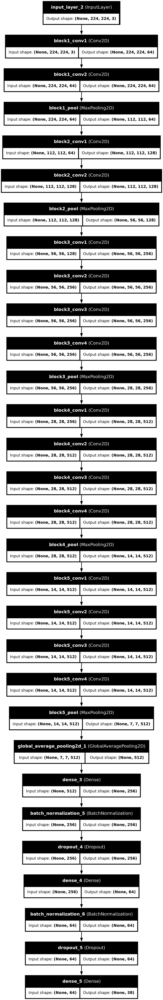

In [37]:
from tensorflow.keras.utils import plot_model
plot_model(vgg_model,show_shapes=True, show_layer_names=True)


In [38]:
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [39]:
# Training the model
vgg_history = vgg_model.fit(train_data,
                    epochs = 10,
                    batch_size=16,
                    shuffle=True,
                    validation_data = valid_data,
                    callbacks = callbacks
                    )


Epoch 1/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 859s 834ms/step - accuracy: 0.4149 - loss: 2.1673 - precision: 0.7083 - recall: 0.2190 - val_accuracy: 0.8076 - val_loss: 0.6250 - val_precision: 0.9086 - val_recall: 0.7070 - learning_rate: 0.0010
Epoch 2/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 769s 772ms/step - accuracy: 0.7236 - loss: 0.8880 - precision: 0.8385 - recall: 0.6084 - val_accuracy: 0.8467 - val_loss: 0.4832 - val_precision: 0.9152 - val_recall: 0.7835 - learning_rate: 0.0010
Epoch 3/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 766s 769ms/step - accuracy: 0.7553 - loss: 0.7701 - precision: 0.8470 - recall: 0.6708 - val_accuracy: 0.8069 - val_loss: 0.6105 - val_precision: 0.8856 - val_recall: 0.7396 - learning_rate: 0.0010
Epoch 4/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 763s 767ms/step - accuracy: 0.7745 - loss: 0.7135 - precision: 0.8515 - recall: 0.7016 - val_accuracy: 0.8493 - val_loss: 0.4517 - val_precision: 0.9063 - val_recall: 0.8028 - learning_rate: 0.0010
Epoch 5/10
989/989 ━━━━━━━━━━━━━━━━━━━━ 747s 751

In [40]:
vgg_history.history

{'accuracy': [0.5674757361412048,
  0.7334945201873779,
  0.759268045425415,
  0.7746120691299438,
  0.7832084894180298,
  0.7919313311576843,
  0.7925476431846619,
  0.7942700982093811,
  0.7988685369491577,
  0.7993110418319702],
 'loss': [1.499415397644043,
  0.8513135313987732,
  0.7578785419464111,
  0.7144127488136292,
  0.6805193424224854,
  0.6575759649276733,
  0.6473290324211121,
  0.6374379992485046,
  0.6260079145431519,
  0.6268463134765625],
 'precision': [0.8118521571159363,
  0.8411547541618347,
  0.8454758524894714,
  0.8521930575370789,
  0.8554055094718933,
  0.8597726225852966,
  0.8587279915809631,
  0.8599734306335449,
  0.8625534772872925,
  0.8618400692939758],
 'recall': [0.37625232338905334,
  0.6270977258682251,
  0.6776018738746643,
  0.7030909061431885,
  0.7158117890357971,
  0.7277266979217529,
  0.7337631583213806,
  0.7359280586242676,
  0.7420751452445984,
  0.742659866809845],
 'val_accuracy': [0.807642936706543,
  0.8467132449150085,
  0.806930005550

In [41]:
vgg_predictions = vgg_model.predict(test_data)

275/275 ━━━━━━━━━━━━━━━━━━━━ 128s 466ms/step


In [43]:
y_pred_vgg = vgg_predictions.argmax(axis=-1)
# Compute classification report
print("Classification report : \n",classification_report(test_data.labels, y_pred_vgg, target_names = train_data.class_indices.keys()))


Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.03      0.03      0.03       504
                                 Apple___Black_rot       0.03      0.03      0.03       497
                          Apple___Cedar_apple_rust       0.02      0.02      0.02       440
                                   Apple___healthy       0.04      0.05      0.04       502
                               Blueberry___healthy       0.03      0.03      0.03       454
          Cherry_(including_sour)___Powdery_mildew       0.03      0.03      0.03       421
                 Cherry_(including_sour)___healthy       0.03      0.03      0.03       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.02      0.02      0.02       410
                       Corn_(maize)___Common_rust_       0.03      0.03      0.03       477
               Corn_(maize)___Northern_Leaf_Blight   

In [44]:
sns.set()

vgg_acc = vgg_history.history['accuracy']
vgg_val_acc = vgg_history.history['val_accuracy']

vgg_precision = vgg_history.history['precision']
vgg_val_precision = vgg_history.history['val_precision']

vgg_recall =vgg_history.history['recall']
vgg_val_recall =vgg_history.history['val_recall']

vgg_loss = vgg_history.history['loss']
vgg_val_loss = vgg_history.history['val_loss']

vgg_epochs = range(1, len(vgg_loss) + 1)

In [45]:
# Evaluate the model
vgg_model_evaluate = vgg_model.evaluate(train_data)
vgg_Loss_train=vgg_model_evaluate[0]
vgg_Accuracy_train=vgg_model_evaluate[1]
vgg_Precision_train=vgg_model_evaluate[2]
vgg_Recall_train=vgg_model_evaluate[3]
print("Loss     : ",vgg_Loss_train)
print("Accuracy : ",vgg_Accuracy_train)
print("Precision  : ",vgg_Precision_train)
print("Recall : ",vgg_Recall_train)

989/989 ━━━━━━━━━━━━━━━━━━━━ 700s 708ms/step - accuracy: 0.9041 - loss: 0.2993 - precision: 0.9362 - recall: 0.8719
Loss     :  0.30073192715644836
Accuracy :  0.9035586714744568
Precision  :  0.9370428919792175
Recall :  0.872586190700531


In [46]:
# Evaluate the model
vgg_model_evaluate = vgg_model.evaluate(valid_data)
print("Loss     : ",vgg_model_evaluate[0])
print("Accuracy : ",vgg_model_evaluate[1])
print("Precision  : ",vgg_model_evaluate[2])
print("Recall : ",vgg_model_evaluate[3])

110/110 ━━━━━━━━━━━━━━━━━━━━ 44s 398ms/step - accuracy: 0.9268 - loss: 0.2357 - precision: 0.9480 - recall: 0.9066
Loss     :  0.3362530767917633
Accuracy :  0.8906316757202148
Precision  :  0.9279975295066833
Recall :  0.8564095497131348


In [47]:
# Evaluate the model
vgg_model_evaluate = vgg_model.evaluate(test_data)
vgg_Loss_test=vgg_model_evaluate[0]
vgg_Accuracy_test=vgg_model_evaluate[1]
vgg_Precision_test=vgg_model_evaluate[2]
vgg_Recall_test=vgg_model_evaluate[3]
print("Loss     : ",vgg_Loss_train)
print("Accuracy : ",vgg_Accuracy_train)
print("Precision  : ",vgg_Precision_train)
print("Recall : ",vgg_Recall_train)

275/275 ━━━━━━━━━━━━━━━━━━━━ 112s 406ms/step - accuracy: 0.8945 - loss: 0.3276 - precision: 0.9306 - recall: 0.8625
Loss     :  0.30073192715644836
Accuracy :  0.9035586714744568
Precision  :  0.9370428919792175
Recall :  0.872586190700531


In [48]:
vgg_f1_score_train=2*(vgg_Precision_train*vgg_Recall_train)/(vgg_Precision_train+vgg_Recall_train)
vgg_f1_score_test=2*(vgg_Precision_test*vgg_Recall_test)/(vgg_Precision_test+vgg_Recall_test)
data_vgg = {
    "Model": ["VGG_Model"],
    "Train Loss": [vgg_Loss_train],
    "Test Loss": [vgg_Loss_test],
    "Train Accuracy": [vgg_Accuracy_train],
    "Test Accuracy": [vgg_Accuracy_test],
    "Train Precision": [vgg_Precision_train],
    "Test Precision": [vgg_Precision_test],
    "Train Recall": [vgg_Recall_train],
    "Test Recall": [vgg_Recall_test],
    "Train F1-Score": [vgg_f1_score_train],
    "Test F1-Score": [vgg_f1_score_test]
}
df_vgg = pd.DataFrame(data_vgg,columns=["Model","Train Loss","Test Loss","Train Accuracy","Test Accuracy","Train Precision","Test Precision","Train Recall","Test Recall","Train F1-Score","Test F1-Score"])

# Display the table
print(df_vgg.head())



       Model  Train Loss  Test Loss  Train Accuracy  Test Accuracy  \
0  VGG_Model    0.300732   0.330834        0.903559       0.892044   

   Train Precision  Test Precision  Train Recall  Test Recall  Train F1-Score  \
0         0.937043        0.928716      0.872586     0.861541        0.903667   

   Test F1-Score  
0       0.893868  


In [49]:
result = pd.concat([df_vgg, df_cnn], ignore_index=True)


In [50]:
result

,Model,Train Loss,Test Loss,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,VGG_Model,0.300732,0.330834,0.903559,0.892044,0.937043,0.928716,0.872586,0.861541,0.903667,0.893868
1,CNN_Model,1.876096,1.896887,0.750166,0.740155,0.873325,0.864334,0.613903,0.602948,0.720988,0.710359
